In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style='whitegrid',color_codes=True)
%matplotlib inline

In [2]:
#import file dengan pandas
df = pd.read_csv('bank-additional/bank-additional-full.csv',sep=';')
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [4]:
# melakukan reduce kategori yang mirip
df.education.unique()

#merubah 
df['education'] = np.where((df.education == 'basic.4y') | (df.education == 'basic.6y') | (df.education == 'basic.9y'),'Basic',df.education)

df.education.unique()

array(['Basic', 'high.school', 'professional.course', 'unknown',
       'university.degree', 'illiterate'], dtype=object)

In [5]:
df.y.value_counts()

no     36548
yes     4640
Name: y, dtype: int64

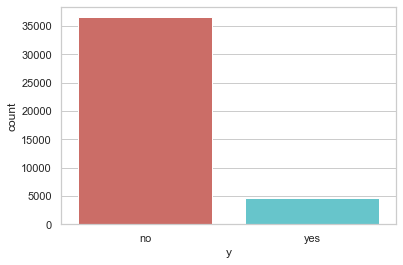

<Figure size 432x288 with 0 Axes>

In [6]:
sns.countplot(x='y',data=df,palette='hls')
plt.show()
plt.savefig('count_plot');

In [7]:
# melakukan persenstas antara yang melakukan subscribe dan tidak

count_sub_y = len(df[df['y']=='yes'])
count_sub_n = len(df[df['y']=='no'])

persentase_y = count_sub_y / (count_sub_y+count_sub_n)
print("persentase dari yes subscribe: ",persentase_y * 100)
persentase_n = count_sub_n / (count_sub_y+count_sub_n)
print("persentase yang no subscribe : ",persentase_n * 100)

persentase dari yes subscribe:  11.265417111780131
persentase yang no subscribe :  88.73458288821988


In [8]:
df.groupby('y').mean()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
y,,,,,,,,,,
no,39.911185,220.844807,2.633085,984.113878,0.132374,0.248875,93.603757,-40.593097,3.811491,5176.166600
yes,40.913147,553.191164,2.051724,792.035560,0.492672,-1.233448,93.354386,-39.789784,2.123135,5095.115991


In [9]:
df.groupby('job').mean()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
job,,,,,,,,,,
admin.,38.187296,254.312128,2.623489,954.319229,0.189023,0.015563,93.534054,-40.245433,3.550274,5164.125350
blue-collar,39.555760,264.542360,2.558461,985.160363,0.122542,0.248995,93.656656,-41.375816,3.771996,5175.615150
entrepreneur,41.723214,263.267857,2.535714,981.267170,0.138736,0.158723,93.605372,-41.283654,3.791120,5176.313530
housemaid,45.500000,250.454717,2.639623,960.579245,0.137736,0.433396,93.676576,-39.495283,4.009645,5179.529623
management,42.362859,257.058140,2.476060,962.647059,0.185021,-0.012688,93.522755,-40.489466,3.611316,5166.650513
retired,62.027326,273.712209,2.476744,897.936047,0.327326,-0.698314,93.430786,-38.573081,2.770066,5122.262151
self-employed,39.949331,264.142153,2.660802,976.621393,0.143561,0.094159,93.559982,-40.488107,3.689376,5170.674384
services,37.926430,258.398085,2.587805,979.974049,0.154951,0.175359,93.634659,-41.290048,3.699187,5171.600126
student,25.894857,283.683429,2.104000,840.217143,0.524571,-1.408000,93.331613,-40.187543,1.884224,5085.939086


In [10]:
df.groupby('marital').mean()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
marital,,,,,,,,,,
divorced,44.899393,253.790330,2.61340,968.639853,0.168690,0.163985,93.606563,-40.707069,3.715603,5170.878643
married,42.307165,257.438623,2.57281,967.247673,0.155608,0.183625,93.597367,-40.270659,3.745832,5171.848772
single,33.158714,261.524378,2.53380,949.909578,0.211359,-0.167989,93.517300,-40.918698,3.317447,5155.199265
unknown,40.275000,312.725000,3.18750,937.100000,0.275000,-0.221250,93.471250,-40.820000,3.313037,5157.393750


In [11]:
df.groupby('age').mean()

,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,,,,,,,,,
17,420.000000,2.200000,401.600000,1.800000,-3.000000,92.247000,-30.500000,0.846600,5064.460000
18,321.785714,1.321429,680.142857,0.750000,-2.282143,93.166750,-37.953571,1.026393,5034.467857
19,271.500000,2.285714,809.785714,0.666667,-1.869048,93.224119,-42.397619,1.242238,5063.307143
20,288.492308,2.353846,861.400000,0.630769,-1.607692,93.257077,-39.515385,1.672508,5080.141538
21,264.245098,2.029412,892.117647,0.284314,-1.434314,93.334422,-40.829412,1.866980,5088.063725
...,...,...,...,...,...,...,...,...,...
91,530.000000,1.500000,999.000000,1.000000,-3.400000,92.379000,-29.800000,0.781000,5017.500000
92,527.500000,1.500000,252.750000,2.000000,-1.750000,93.951500,-39.150000,0.796750,5000.150000
94,134.000000,1.000000,999.000000,1.000000,-3.400000,92.649000,-30.100000,0.716000,5017.500000


Text(0, 0.5, 'frkuensi pembelian')

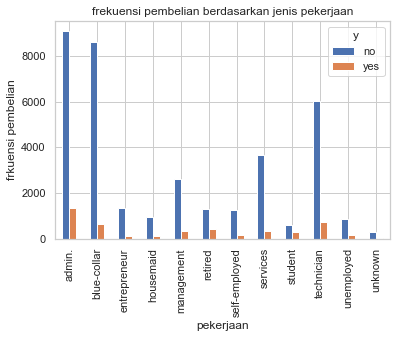

In [12]:
pd.crosstab(df.job,df.y).plot(kind='bar')
plt.title('frekuensi pembelian berdasarkan jenis pekerjaan')
plt.xlabel('pekerjaan')
plt.ylabel('frkuensi pembelian')

Text(0, 0.5, 'frkuensi pembelian')

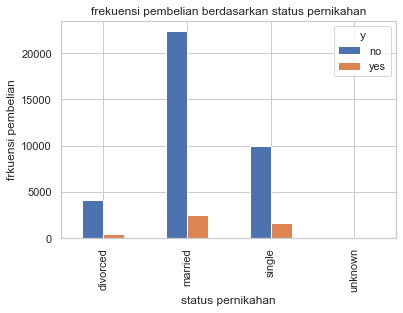

In [13]:
pd.crosstab(df.marital,df.y).plot(kind='bar')
plt.title('frekuensi pembelian berdasarkan status pernikahan')
plt.xlabel('status pernikahan')
plt.ylabel('frkuensi pembelian')

Text(0, 0.5, 'frkuensi pembelian')

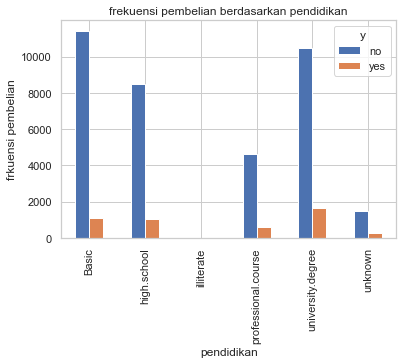

In [14]:
pd.crosstab(df.education,df.y).plot(kind='bar')
plt.title('frekuensi pembelian berdasarkan pendidikan')
plt.xlabel('pendidikan')
plt.ylabel('frkuensi pembelian')

Text(0, 0.5, 'frkuensi pembelian')

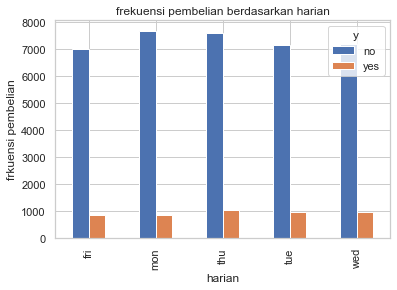

In [15]:
pd.crosstab(df.day_of_week,df.y).plot(kind='bar')
plt.title('frekuensi pembelian berdasarkan harian')
plt.xlabel('harian')
plt.ylabel('frkuensi pembelian')

Text(0, 0.5, 'frkuensi pembelian')

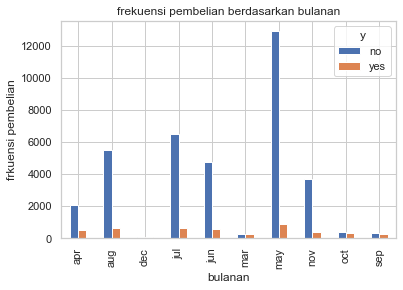

In [16]:
pd.crosstab(df.month,df.y).plot(kind='bar')
plt.title('frekuensi pembelian berdasarkan bulanan')
plt.xlabel('bulanan')
plt.ylabel('frkuensi pembelian')

### Distribusi berdasarkan Usia

Text(0, 0.5, 'frekuensi')

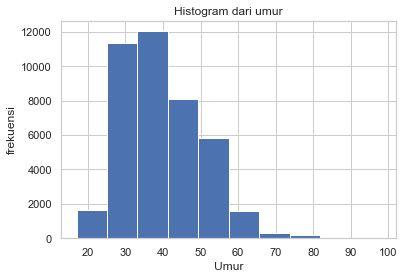

In [17]:
df.age.hist()
plt.title('Histogram dari umur')
plt.xlabel('Umur')
plt.ylabel('frekuensi')

In [18]:
df.drop(df.columns[[0, 3, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19]], axis=1, inplace=True)
data = pd.get_dummies(df,columns =['job', 'marital', 'default', 'housing', 'loan', 'poutcome'])

In [19]:
data

,y,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,...,default_yes,housing_no,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,poutcome_failure,poutcome_nonexistent,poutcome_success
0,no,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
1,no,0,0,0,0,0,0,0,1,0,...,0,1,0,0,1,0,0,0,1,0
2,no,0,0,0,0,0,0,0,1,0,...,0,0,0,1,1,0,0,0,1,0
3,no,1,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
4,no,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,yes,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,1,0
41184,no,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
41185,no,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,1,0
41186,yes,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0


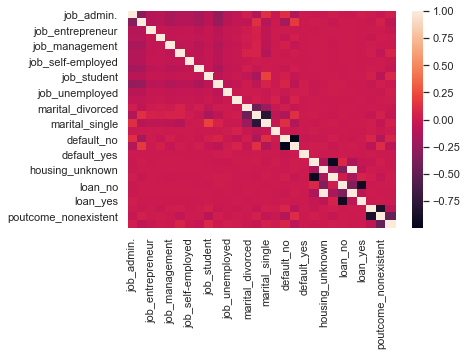

In [20]:
sns.heatmap(data.corr())
plt.show()

In [21]:
X = data.iloc[:,1:]
y = data.iloc[:,0]

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [23]:
X_train.shape

(30891, 28)

### Logistic Regression

In [24]:
cls = LogisticRegression()
cls.fit(X_train,y_train)

/Users/pusdatin/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

### Confusion Matrix

In [25]:
y_pred = cls.predict(X_test)
from sklearn.metrics import confusion_matrix
cfm = confusion_matrix(y_test,y_pred)
print(cfm)

[[9016  123]
 [ 946  212]]


In [26]:
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(cls.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.90


In [27]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          no       0.91      0.99      0.94      9139
         yes       0.63      0.18      0.28      1158

    accuracy                           0.90     10297
   macro avg       0.77      0.58      0.61     10297
weighted avg       0.87      0.90      0.87     10297



In [28]:
pd.set_option("display.max_columns",None)

In [29]:
data

,y,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single,marital_unknown,default_no,default_unknown,default_yes,housing_no,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,poutcome_failure,poutcome_nonexistent,poutcome_success
0,no,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0
1,no,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0
2,no,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0
3,no,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0
4,no,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,yes,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0
41184,no,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0
41185,no,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0
41186,yes,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0


### KNN

In [30]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train, y_train)


KNeighborsClassifier()

In [31]:
y_pred = knn.predict(X_test)


In [32]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8902592988249004


### SVM

In [33]:
from sklearn import svm

cls_svm= svm.SVC(kernel='linear')

cls_svm.fit(X_train,y_train)

y_pred = cls_svm.predict(X_test)


In [34]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8957948917160338


### Decision Tree

In [35]:
import sklearn.tree as tree
import pydotplus
from six import StringIO
from IPython.display import Image

In [36]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()
dt.fit(X_train,y_train)
y_pred = dt.predict(X_test)

In [37]:
from sklearn.metrics import accuracy_score
print("Akurasi: ",accuracy_score(y_pred,y_test))

Akurasi:  0.8951150820627367


In [38]:
feature_cols=data.columns[1:]
feature_cols

Index(['job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single',
       'marital_unknown', 'default_no', 'default_unknown', 'default_yes',
       'housing_no', 'housing_unknown', 'housing_yes', 'loan_no',
       'loan_unknown', 'loan_yes', 'poutcome_failure', 'poutcome_nonexistent',
       'poutcome_success'],
      dtype='object')

In [39]:
dot_data = StringIO()
tree.export_graphviz(dt,out_file=dot_data, class_names=['0','1'], feature_names=feature_cols, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.898736 to fit



In [40]:
from sklearn import metrics
dt = DecisionTreeClassifier(criterion="entropy",max_depth=3)
dt = dt.fit(X_train,y_train)
y_pred = dt.predict(X_test)

print("Accuracy: ", metrics.accuracy_score(y_test,y_pred))

Accuracy:  0.8958920073807906


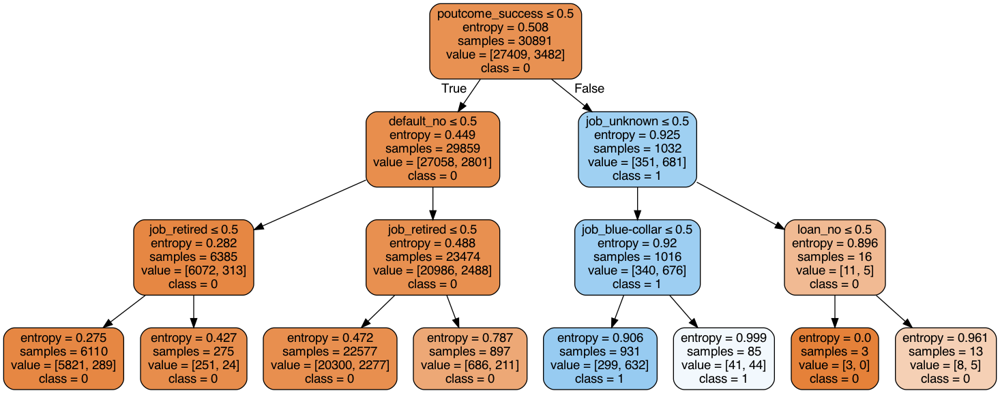

In [41]:
dot_data = StringIO()
tree.export_graphviz(dt,out_file=dot_data, class_names=['0','1'], feature_names=feature_cols, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [42]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)

### Random Forest

In [43]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators= 1000)

clf.fit(X_train,y_train)

y_pred = clf.predict(X_test)

In [44]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_pred,y_test))

0.8954438779639071


In [45]:
clf.predict([[0, 0, 1, 0,
       0, 0, 0, 0,
       0, 0, 0, 0,
       0, 0, 1,
       0, 0, 0, 1,
       0, 0, 0,0,
       0, 1, 0, 0,
       1]])

array(['no'], dtype=object)

In [46]:
clf.feature_importances_

array([1.50416651e-02, 2.53282529e-02, 9.22414437e-03, 1.01981233e-02,
       1.00971489e-02, 4.75177955e-02, 9.83243009e-03, 1.27396639e-02,
       3.61281285e-02, 1.36573610e-02, 1.22735398e-02, 1.59437998e-02,
       1.54041805e-02, 1.92171796e-02, 2.06519594e-02, 3.79738135e-03,
       2.79576831e-02, 2.41737510e-02, 9.35776755e-05, 2.10192507e-02,
       4.25036229e-03, 2.13330258e-02, 1.91712940e-02, 4.23476571e-03,
       1.88191590e-02, 8.27190173e-02, 1.29549182e-01, 3.69626177e-01])

In [47]:
feature_imp= pd.Series(clf.feature_importances_,index=feature_cols).sort_values(ascending=False)
feature_imp

poutcome_success        0.369626
poutcome_nonexistent    0.129549
poutcome_failure        0.082719
job_retired             0.047518
job_student             0.036128
default_no              0.027958
job_blue-collar         0.025328
default_unknown         0.024174
housing_yes             0.021333
housing_no              0.021019
marital_single          0.020652
marital_married         0.019217
loan_no                 0.019171
loan_yes                0.018819
job_unknown             0.015944
marital_divorced        0.015404
job_admin.              0.015042
job_technician          0.013657
job_services            0.012740
job_unemployed          0.012274
job_housemaid           0.010198
job_management          0.010097
job_self-employed       0.009832
job_entrepreneur        0.009224
housing_unknown         0.004250
loan_unknown            0.004235
marital_unknown         0.003797
default_yes             0.000094
dtype: float64

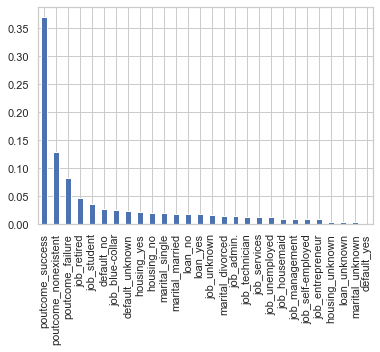

In [48]:
 import matplotlib.pyplot as plt
feature_imp.plot(kind='bar');

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

### Naive Bayes

In [50]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train,y_train)
y_pred=gnb.predict(X_test)

In [51]:
print(accuracy_score(y_pred,y_test))

0.35767699329901914
